In [40]:
from PIL import Image

import numpy as np
from tqdm import tqdm

import cv2
import matplotlib.pyplot as plt

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
import torchvision
import torchvision.transforms as transforms
from torchvision.models import vgg19
import os

import albumentations as A
from albumentations.pytorch import ToTensorV2
device="cuda" if torch.cuda.is_available() else "cpu"
device

'cuda'

In [41]:
class CreateDataset(Dataset):
    def __init__(self, root_dir, lowres_transform, highres_transform, both_transform):
        super(CreateDataset, self).__init__()
        self.root_dir = root_dir
        
        self.lowres_transform = lowres_transform
        self.highres_transform = highres_transform
        self.both_transform = both_transform
        self.list_of_files = os.listdir(os.path.join(root_dir))
        
    def __len__(self):
        return len(self.list_of_files)
    
    def __getitem__(self, index):
        image = cv2.imread(os.path.join(self.root_dir, self.list_of_files[index]))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        
        image = self.both_transform(image = image)['image']
        
        
        low_res_image = self.lowres_transform(image=image)['image']
        high_res_image = self.highres_transform(image=image)['image']
        
        return low_res_image, high_res_image

In [42]:
highRes = 128
lowRes = highRes//4
num_channels = 3

In [43]:
highresTransform = A.Compose(
    [
        A.Resize(width = highRes, height = highRes),
        A.Normalize(mean = [0,0,0], std = [1,1,1]),
        ToTensorV2(),
    ]
)

lowresTransform = A.Compose(
    [
        A.Resize(width = lowRes, height = lowRes, interpolation = Image.BICUBIC),
        A.Normalize(mean = [0,0,0], std = [1,1,1]),
        ToTensorV2(),
    ]
)

bothTransform = A.Compose(
    [
        A.RandomCrop(width = highRes, height = highRes),
        A.HorizontalFlip(p=0.5),
        A.RandomRotate90(p=0.5),
    ]
)

In [44]:
# trainDataset = CreateDataset(
#     root_dir = r'/kaggle/input/div2k/DIV2K_train_HR/DIV2K_train_HR',
#     lowres_transform = lowresTransform,
#     highres_transform = highresTransform,
#     both_transform = bothTransform
# )

# valDataset = CreateDataset(
#     root_dir = r'/kaggle/input/div2k/DIV2K_valid_HR/DIV2K_valid_HR',
#     lowres_transform = lowresTransform,
#     highres_transform = highresTransform,
#     both_transform = bothTransform
# )
trainDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_train_HR\DIV2K_train_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)

valDataset = CreateDataset(
    root_dir = r'archive (3)\DIV2K_valid_HR\DIV2K_valid_HR',
    lowres_transform = lowresTransform,
    highres_transform = highresTransform,
    both_transform = bothTransform
)

In [45]:
torch.backends.cuda.matmul.allow_tf32 = False
torch.backends.cudnn.benchmark = True

In [46]:
num_workers = 0
batch_size = 64
# batch_size=8
trainDataLoader = DataLoader(
    trainDataset,
    batch_size=batch_size,
    shuffle=True,
    pin_memory=True,
    num_workers=num_workers
)

valDataLoader = DataLoader(
    valDataset,
    batch_size=1,
    shuffle=True,
    pin_memory=True,
    num_workers=num_workers
)

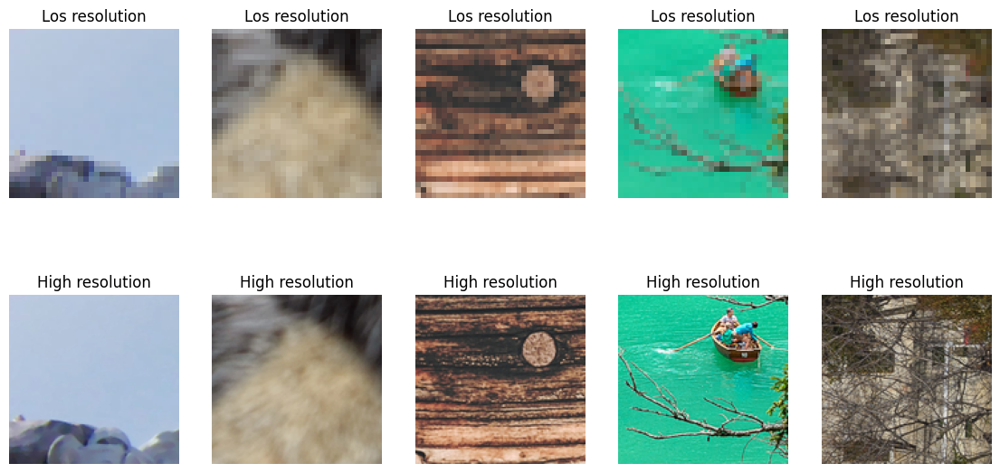

In [47]:
fig, axes = plt.subplots(2,5, figsize = (14, 7))

for i, (low_res, high_res) in enumerate(valDataLoader):
    if i >= 5:
        plt.show()
        break
    
    axes[0, i].imshow(low_res[0].permute(1,2,0))
    axes[0, i].set_title("Los resolution")
    axes[0, i].axis('off')
    
    axes[1, i].imshow(high_res[0].permute(1,2,0))
    axes[1, i].set_title("High resolution")
    axes[1, i].axis('off')

In [48]:
class ConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_act, kernel_size = 3, stride = 1, padding = 1):
        super().__init__()
        self.cnn = nn.Conv2d(
            in_channels,
            out_channels,
            kernel_size = kernel_size,
            stride = stride,
            padding = padding
        )
        self.act = nn.LeakyReLU(0.2, inplace=True) if use_act else nn.Identity()
        
    def forward(self, x):
        return self.act(self.cnn(x))

In [49]:
class UpsampleBlock(nn.Module):
    def __init__(self, in_channels, scale_factor = 2):
        super().__init__()
        self.upsample = nn.Upsample(scale_factor=scale_factor, mode="nearest")
        self.conv = nn.Conv2d(in_channels, in_channels, 3, 1, 1, bias=True)
        self.act = nn.LeakyReLU(0.2, inplace=True)
        
    def forward(self, x):
        return self.act(self.conv(self.upsample(x)))

In [50]:
import torch.nn as nn
class DenseResidualBlock(nn.Module):
    def __init__(self, in_channels, channels = 32, residual_beta = 0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.blocks = nn.ModuleList()
        
        for i in range(5):
            self.blocks.append(
                ConvBlock(
                    in_channels + channels*i,
                    channels if i <= 3 else in_channels,
                    kernel_size=3,
                    stride=1,
                    padding=1,
                    use_act=True if i <=3 else False,
                )
            )
        
    def forward(self, x):
        new_inputs = x
        for block in self.blocks:
            out = block(new_inputs)
            new_inputs = torch.cat([new_inputs, out], dim=1)
        
        return self.residual_beta * out + x

In [51]:
class RRDB(nn.Module):
    def __init__(self, in_channels, residual_beta = 0.2):
        super().__init__()
        self.residual_beta = residual_beta
        self.rrdb = nn.Sequential(*[DenseResidualBlock(in_channels) for _ in range(3)])
    
    def forward(self, x):
        return self.rrdb(x) * self.residual_beta + x

In [52]:
class Generator(nn.Module):
    def __init__(self, in_channels = 3, num_channels = 64, num_blocks = 5):
        super().__init__()
        self.initial = nn.Conv2d(
            in_channels = in_channels,
            out_channels = num_channels,
            kernel_size = 3,
            stride = 1,
            padding = 1,
            bias = True
        )
        self.residuals = nn.Sequential(*[RRDB(num_channels) for _ in range(num_blocks)])
        self.conv = nn.Conv2d(num_channels, num_channels, kernel_size = 3, stride = 1, padding = 1)
        self.upsamples = nn.Sequential(
            UpsampleBlock(num_channels),
            UpsampleBlock(num_channels)
        )
        self.final = nn.Sequential(
            nn.Conv2d(num_channels, num_channels, kernel_size = 3, stride = 1, padding = 1, bias = True),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Conv2d(num_channels, in_channels, kernel_size=1, stride=1, padding=0, bias=True)
        )
        
    def forward(self, x):
        initial = self.initial(x)
        out = self.residuals(initial)
        out = self.conv(out) + initial
        out = self.upsamples(out)
        out = self.final(out)
        return out

In [53]:
class Discriminator(nn.Module):
    def __init__(self, in_channels = 3, features = (64, 64, 128, 256, 256, 512, 512)):
        super().__init__()
        self.in_channels = in_channels
        self.features = list(features)
        
        self.blocks = nn.Sequential(
            ConvBlock(in_channels, 64, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(64, 64, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(64, 128, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(128, 256, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(256, 256, kernel_size=3, stride=1, padding=1, use_act=True),
            ConvBlock(256, 512, kernel_size=3, stride=2, padding=1, use_act=True),
            ConvBlock(512, 512, kernel_size=3, stride=1, padding=1, use_act=True)
        )
        
        self.classifier = nn.Sequential(
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(in_features=512*6*6, out_features=1024),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(in_features=1024, out_features=1)
        )
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        features = self.blocks(x)
        out = self.classifier(features)
        return out


In [54]:
def init_weight(model, scale = 0.1):
    for m in model.modules():
        if isinstance(m, nn.Conv2d):
            nn.init.kaiming_normal_(m.weight.data)
            m.weight.data *= scale
            
        elif isinstance(m, nn.Linear):
            nn.init.Kaiming_normal_(m.weight.data)
            m.weight.data *= scale

In [55]:
def test_size():
    gen = Generator()
    disc = Discriminator()
    low_res = 24
    x = torch.randn((5, 3, low_res, low_res))
    gen_out = gen(x)
    disc_out = disc(x)
    
    print(gen_out.shape)
    print(disc_out.shape)

In [56]:
test_size()

torch.Size([5, 3, 96, 96])
torch.Size([5, 1])


In [57]:
class VGGLoss(nn.Module):
    def __init__(self, device):
        super().__init__()
        
        self.vgg = vgg19(pretrained = True).features[:35].eval().to(device)
        self.loss = nn.MSELoss()
        
        for param in self.vgg.parameters():
            param.requires_grad = False
            
    def forward(self, output, target):
        vgg_input_features = self.vgg(output)
        vgg_target_features = self.vgg(target)
        loss = self.loss(vgg_input_features, vgg_target_features)
        
        return loss

In [58]:
class ESRGANLoss(nn.Module):
    def __init__(self, l1_weight = 1e-2, vgg_weight = 1, device = 'cpu'):
        super().__init__()
        
        self.vgg_criterion = VGGLoss(device)
        self.l1_criterion = nn.L1Loss().to(device)
        self.l1_weight = l1_weight
        
    def forward(self, output, target):
        vgg_loss = self.vgg_criterion(output, target)
        l1_loss = self.l1_criterion(output, target)
        
        loss = vgg_loss + self.l1_weight * l1_loss
        return loss

In [59]:
def gradient_penalty(critic, real, fake, device):
    batch_size, channels, height, width = real.shape
    alpha = torch.rand((batch_size, 1,1,1)).repeat(1, channels, height, width).to(device)
    interpolated_images = real*alpha + fake.detach() * (1 - alpha)
    interpolated_images.requires_grad_(True)
    
    mixed_scores = critic(interpolated_images)
    
    gradient = torch.autograd.grad(
        inputs = interpolated_images,
        outputs = mixed_scores,
        grad_outputs = torch.ones_like(mixed_scores),
        create_graph = True,
        retain_graph = True,
    )[0]
    gradient = gradient.view(gradient.shape[0], -1)
    gradient_norm = gradient.norm(2, dim = 1)
    gradient_penalty = torch.mean((gradient_norm - 1) ** 2)
    
    return gradient_penalty

In [60]:
device = "cuda" if torch.cuda.is_available() else "cpu"

In [61]:
lr = 1e-4
num_epochs = 5
lambda_gp = 10


In [62]:
num_channels = 3
netG = Generator(in_channels = num_channels, num_blocks = 5).to(device)
netD = Discriminator(in_channels = num_channels).to(device)
init_weight(netG)

model = {
    'discriminator': netD,
    'generator': netG
}

In [63]:
optimizerNetG = torch.optim.Adam(model['generator'].parameters(), lr = lr, betas = (0.0, 0.9))
opimizerNetD = torch.optim.Adam(model['discriminator'].parameters(), lr=lr, betas=(0.0, 0.9))

optimizer = {
    'discriminator': opimizerNetD,
    'generator': optimizerNetG
}

In [64]:
criterion_generator = ESRGANLoss(l1_weight = 1e-2, device = device)
criterion_discriminator = nn.BCELoss().to(device)
criterion = {
    'discriminator': criterion_discriminator,
    'generator': criterion_generator
}

In [65]:
device = 'cuda' if torch.cuda.is_available() else 'cpu'
generator_scaler = torch.amp.GradScaler(device)
discriminator_scaler = torch.amp.GradScaler(device)


In [66]:
def train(
    loader,
    disc,
    gen,
    opt_gen,
    opt_disc,
    l1,
    vgg_loss,
    g_scaler,
    d_scaler,
    tb_step,
    num_epochs=10,
    device='cpu'
):
    # List to store losses
    loss_history = []

    for iteration in range(num_epochs):
        loop = tqdm(loader, leave=True)

        for idx, (low_res, high_res) in enumerate(loop):
            high_res = high_res.to(device)
            low_res = low_res.to(device)

            # Train Discriminator
            with torch.cuda.amp.autocast():
                fake = gen(low_res)
                critic_real = disc(high_res)
                critic_fake = disc(fake.detach())
                gp = gradient_penalty(disc, high_res, fake, device=device)
                loss_critic = (
                    -(torch.mean(critic_real) - torch.mean(critic_fake))
                    + lambda_gp * gp
                )

            # Discriminator Loss
            opt_disc.zero_grad()
            d_scaler.scale(loss_critic).backward()
            d_scaler.step(opt_disc)
            d_scaler.update()

            # Train Generator
            with torch.cuda.amp.autocast():
                l1_loss = 1e-2 * l1(fake, high_res)
                adversarial_loss = 5e-3 * -torch.mean(disc(fake))
                loss_for_vgg = vgg_loss(fake, high_res)
                gen_loss = l1_loss + loss_for_vgg + adversarial_loss

            # Generator Loss
            opt_gen.zero_grad()
            g_scaler.scale(gen_loss).backward()
            g_scaler.step(opt_gen)
            g_scaler.update()
            tb_step += 1

            # Storing the loss values for each iteration
            loss_history.append({
                'epoch': iteration,
                'gp': gp.item(),
                'critic': loss_critic.item(),
                'l1': l1_loss.item(),
                'vgg': loss_for_vgg.item(),
                'adversarial': adversarial_loss.item()
            })

            loop.set_postfix(
                epoch=str(iteration) + "/" + str(num_epochs),
                gp=gp.item(),
                critic=loss_critic.item(),
                l1=l1_loss.item(),
                vgg=loss_for_vgg.item(),
                adversarial=adversarial_loss.item(),
            )

    return loss_history


In [67]:
loss_history = train(
    loader = trainDataLoader,
    disc = model["discriminator"],
    gen = model['generator'],
    opt_gen = optimizer['generator'],
    opt_disc = optimizer['discriminator'],
    l1 = nn.L1Loss(),
    vgg_loss = VGGLoss(device),
    g_scaler = generator_scaler,
    d_scaler = discriminator_scaler,
    tb_step = 0,
    device = device,
    num_epochs = 150
)

  0%|          | 0/13 [00:00<?, ?it/s]C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_12656\1585474939.py:26: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_12656\1585474939.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast():
100%|██████████| 13/13 [02:24<00:00, 11.12s/it, adversarial=0.431, critic=-25.4, epoch=149/150, gp=0.673, l1=0.00154, vgg=2.43]


In [68]:
torch.save(model['generator'].state_dict(), "super_res_gen.pth")

In [69]:
import torch
import torch.nn.functional as F
import numpy as np
from torchvision import transforms
import math
from tqdm import tqdm
torch.save(model['generator'], "super_res_gen_full.pth")

def calculate_psnr(generator, test_loader, device='cuda'):
    generator.eval()  # Set model to evaluation mode
    psnr_list = []
    
    with torch.no_grad():  # Don't compute gradients for efficiency
        for data in tqdm(test_loader):
            # Assuming the test_loader yields a batch of (low_res, high_res)
            low_res_images, high_res_images = data
            low_res_images = low_res_images.to(device)
            high_res_images = high_res_images.to(device)
            
            # Generate the high-resolution images from the generator
            generated_images = generator(low_res_images)
            
            # Convert to a range between 0 and 1 if using normalized images
            generated_images = torch.clamp(generated_images, 0.0, 1.0)
            high_res_images = torch.clamp(high_res_images, 0.0, 1.0)
            
            # Calculate the Mean Squared Error (MSE)
            mse = F.mse_loss(generated_images, high_res_images, reduction='mean')
            
            # Calculate PSNR (using 255 for 8-bit images, adjust if using a different range)
            psnr = 10 * torch.log10(1.0 / mse)
            psnr_list.append(psnr.item())
    
    avg_psnr = np.mean(psnr_list)
    print(f"Average PSNR: {avg_psnr} dB")
    return avg_psnr


In [70]:
calculate_psnr(model['generator'], trainDataLoader)

100%|██████████| 13/13 [01:05<00:00,  5.08s/it]

Average PSNR: 14.400075032160832 dB


14.400075032160832

In [71]:
calculate_psnr(model['generator'], valDataLoader)

100%|██████████| 100/100 [00:23<00:00,  4.29it/s]

Average PSNR: 15.094135484695435 dB


15.094135484695435

In [72]:
import numpy as np
import matplotlib.pyplot as plt

# Assuming loss_history is already defined with the correct format.
epochs = []
gp = []
critic = []
l1 = []
adversarial = []
vgg = []

for epoch in range(150):
    epochs.append(loss_history[epoch]['epoch'])
    gp.append(loss_history[epoch]['gp'])
    critic.append(loss_history[epoch]['critic'])
    l1.append(loss_history[epoch]['l1'])
    adversarial.append(loss_history[epoch]['adversarial'])
    vgg.append(loss_history[epoch]['vgg'])

l1 = np.array(l1)
adversarial = np.array(adversarial)
vgg = np.array(vgg)
gp = np.array(gp)
critic = np.array(critic)


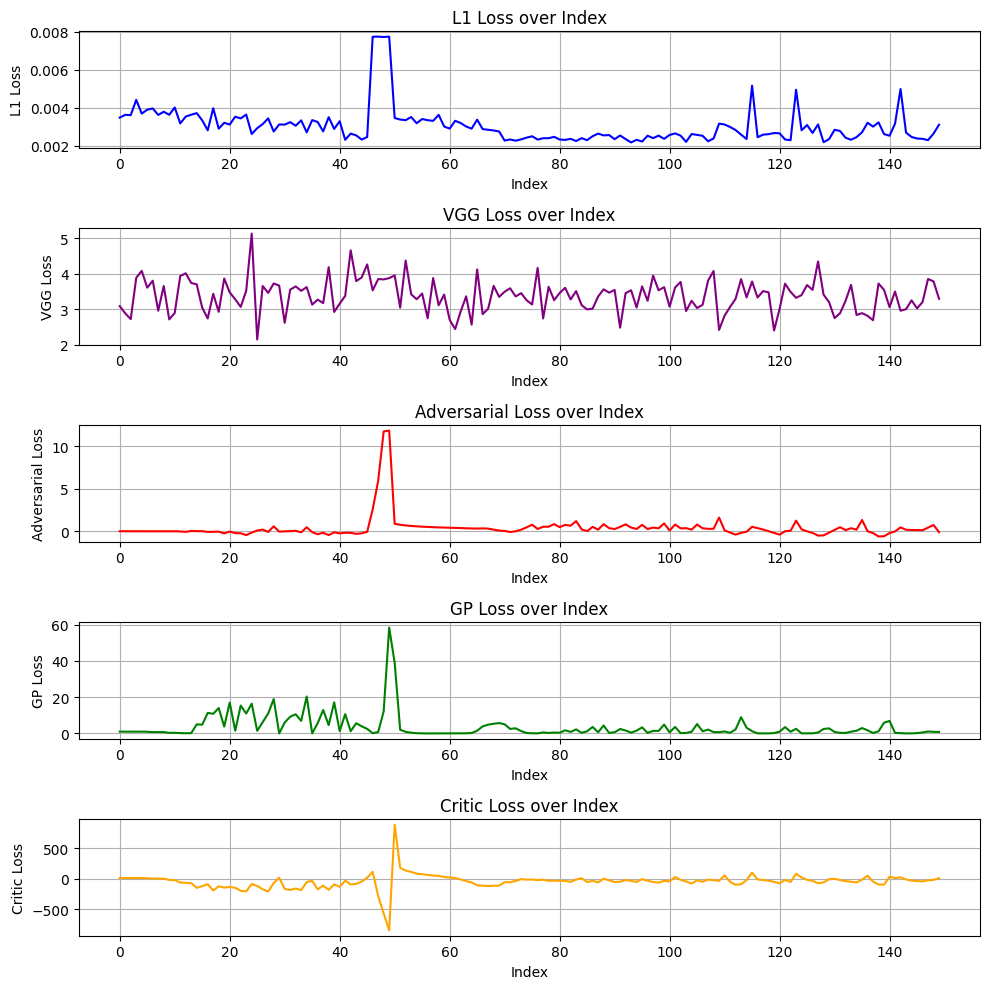

In [73]:
fig, axs = plt.subplots(5, 1, figsize=(10, 10))

# Plot L1 loss
axs[0].plot(range(len(l1)), l1, label='L1 Loss', color='blue')
axs[0].set_xlabel("Index")
axs[0].set_ylabel("L1 Loss")
axs[0].set_title("L1 Loss over Index")
axs[0].grid(True)

# Plot GP loss
axs[3].plot(range(len(gp)), gp, label='GP Loss', color='green')
axs[3].set_xlabel("Index")
axs[3].set_ylabel("GP Loss")
axs[3].set_title("GP Loss over Index")
axs[3].grid(True)

# Plot VGG loss
axs[1].plot(range(len(vgg)), vgg, label='VGG Loss', color='purple')
axs[1].set_xlabel("Index")
axs[1].set_ylabel("VGG Loss")
axs[1].set_title("VGG Loss over Index")
axs[1].grid(True)

# Plot Critic loss
axs[4].plot(range(len(critic)), critic, label='Critic Loss', color='orange')
axs[4].set_xlabel("Index")
axs[4].set_ylabel("Critic Loss")
axs[4].set_title("Critic Loss over Index")
axs[4].grid(True)

# Plot Adversarial loss
axs[2].plot(range(len(adversarial)), adversarial, label='Adversarial Loss', color='red')
axs[2].set_xlabel("Index")
axs[2].set_ylabel("Adversarial Loss")
axs[2].set_title("Adversarial Loss over Index")
axs[2].grid(True)

plt.tight_layout()
plt.show()


 20%|██        | 20/100 [00:05<00:13,  5.75it/s]C:\Users\ArnavBhatia\AppData\Local\Temp\ipykernel_12656\45355361.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, axes = plt.subplots(1, 3)
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.0058546327..0.48037052].
 78%|███████▊  | 78/100 [00:13<00:02,  7.88it/s]Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.059258062..0.19902161].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.12885286..0.6995999].
100%|██████████| 100/100 [00:16<00:00,  6.10

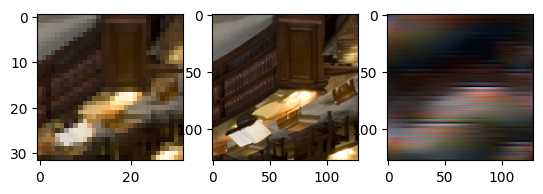

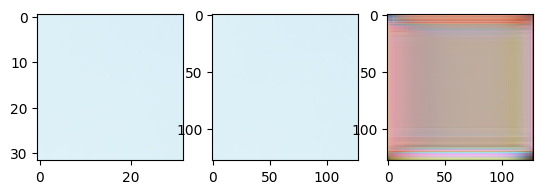

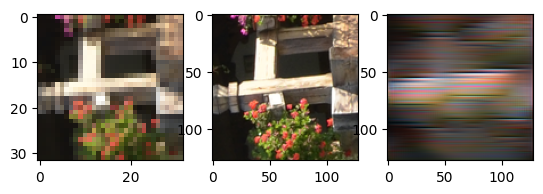

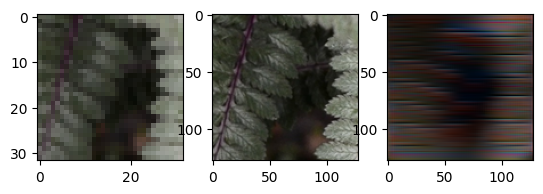

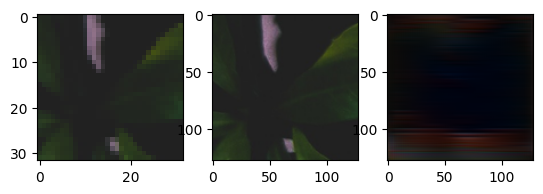

...

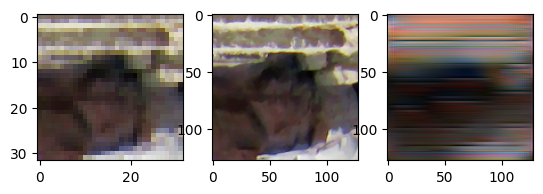

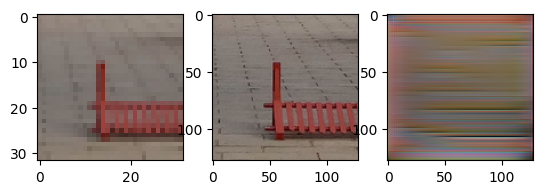

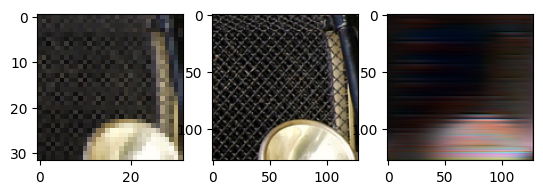

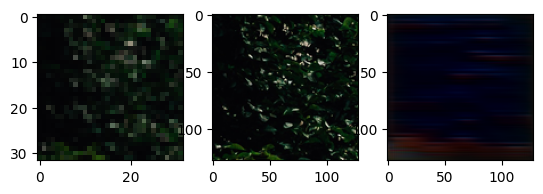

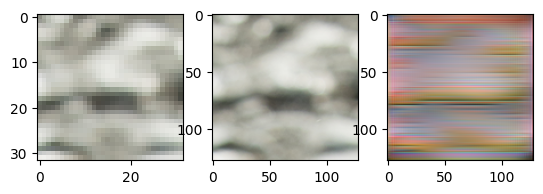

In [74]:
import matplotlib.pyplot as plt

topil = transforms.ToPILImage()
i = 0

for iteration, (low_res, high_res) in enumerate(tqdm(valDataLoader)):
    if i>20:
        break
    fig, axes = plt.subplots(1, 3)
    
    axes[0].imshow(low_res[0].permute(1,2,0))
    axes[1].imshow(high_res[0].permute(1, 2, 0))
    low_res = low_res.to(device)
    fake_high_res = model['generator'](low_res)
    fake_high_res = fake_high_res.to('cpu').detach()
    axes[2].imshow(fake_high_res[0].permute(1, 2, 0))